#### Loading Dependencies

In [1]:
%load_ext tensorboard
import tensorflow as tf
print(tf.__version__)

2.0.0


In [2]:
%%time
%load_ext tensorboard
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={"figure.figsize":(12,10)})
sns.set_style("whitegrid")
sns.set_context("talk")
sns.set_context("notebook")
%matplotlib inline
%config InlineBackend.figure_format = "retina"
import plotly.offline as pyo
import plotly.graph_objs as go
import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow import keras
import tensorflow.keras.backend as K
from tensorflow.keras import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import (EarlyStopping, LearningRateScheduler, 
                                        TensorBoard, ModelCheckpoint)
from tensorflow.keras.layers import ( Dense, Dropout, Conv2D, 
                                     MaxPool2D, UpSampling2D, 
                                     Activation, BatchNormalization, 
                                     Dropout )
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, adjusted_mutual_info_score

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Wall time: 1.27 s


#### Loading Fashion MNIST Dataset

In [3]:

from tensorflow.keras.datasets.fashion_mnist import load_data
(X_train, y_train), (X_test, y_test) = load_data()

#### Normalizing the data using min-max scalar

In [4]:
X_train, X_test = X_train.reshape(-1,28,28,1)/255.0, X_test.reshape(-1,28,28,1)/255.0

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")

Shape of X_train: (60000, 28, 28, 1)
Shape of X_test: (10000, 28, 28, 1)


#### Spltting data into train and validation

In [5]:
X_train, X_validate, y_train, y_validate = train_test_split(X_train, 
                                                            y_train, 
                                                            test_size=0.2, 
                                                            stratify=y_train, 
                                                            random_state=2019)
print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_validate.shape}")

Shape of X_train: (48000, 28, 28, 1)
Shape of X_test: (12000, 28, 28, 1)


#### Visualizing the Fashion MNIST Dataset

Text(0.5, 1.05, 'Fashion MNIST Dataset')

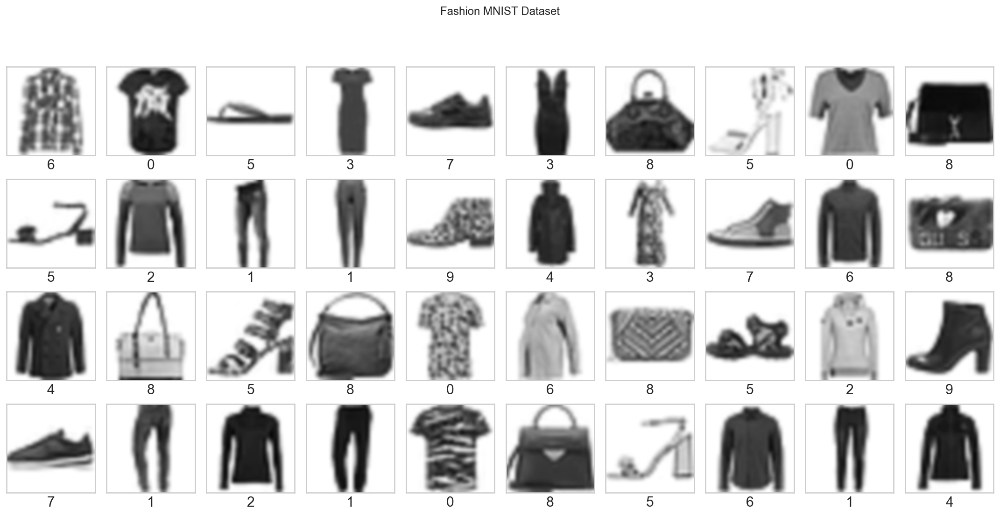

In [6]:
plt.figure(figsize=(15,15))
for i in range(0,40):
    plt.subplot(9,10,i + 1)
    grid_data = X_train[i].squeeze()
    plt.imshow(grid_data, interpolation = "bicubic", cmap = plt.cm.binary)
    plt.xticks([])
    plt.yticks([])
    plt.grid(True)
    plt.xlabel(y_train[i],fontsize=15)
plt.tight_layout()
plt.suptitle('Fashion MNIST Dataset',y=1.05)

#### Determine explained variance ratio of each variables

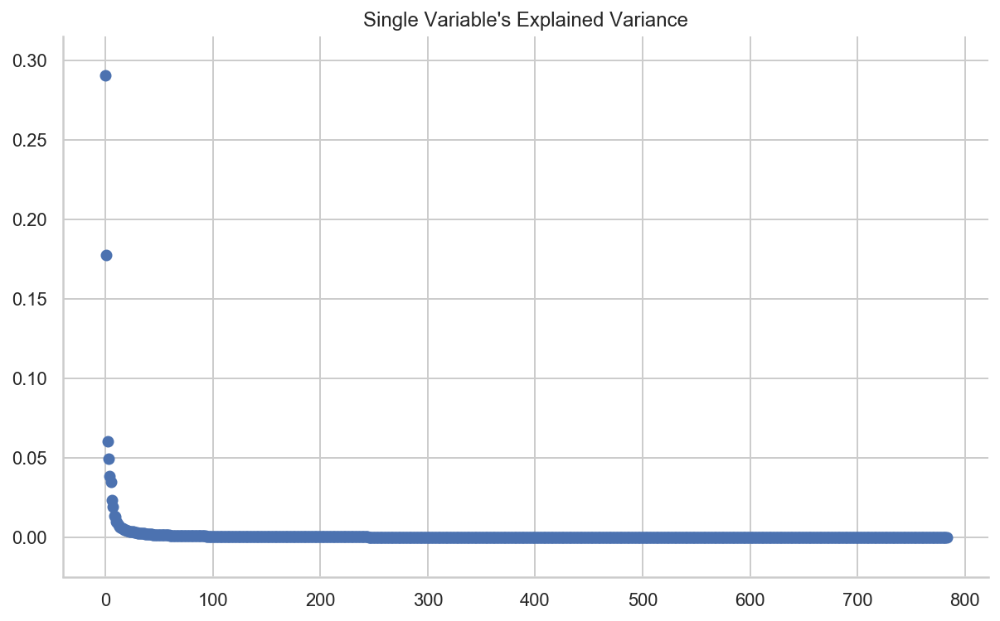

In [7]:
from sklearn.decomposition import PCA
pca = PCA(n_components=784).fit(X_train.reshape(-1,784))
plt.figure(figsize=(10,6))
plt.scatter(list(range(784)), pca.explained_variance_ratio_)
plt.title("Single Variable's Explained Variance")
sns.despine(offset=0.2)

#### Determine explained variance ratio of cumulative variables

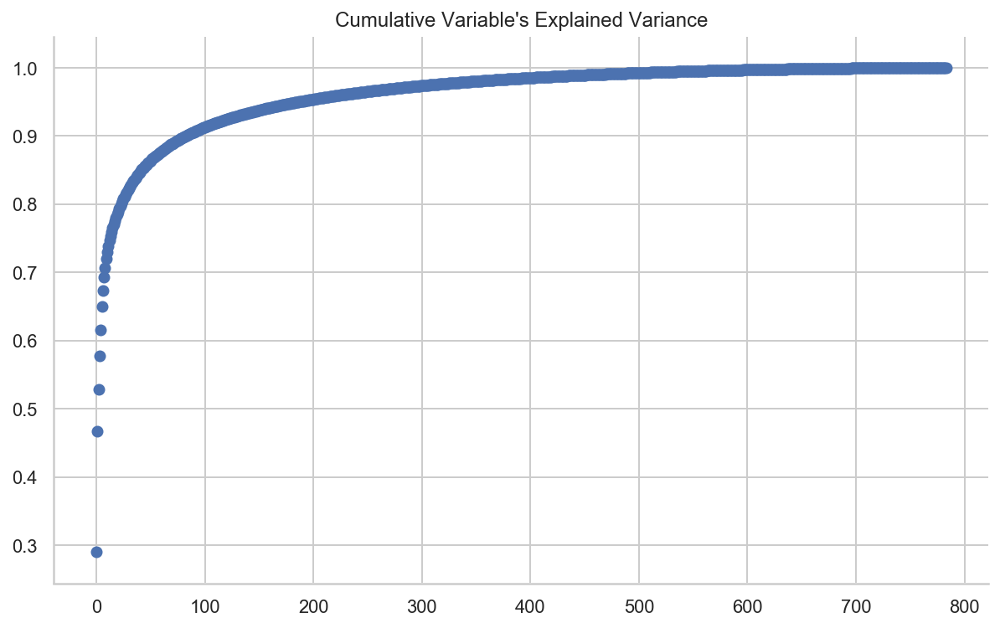

In [8]:
from sklearn.decomposition import PCA
pca = PCA(n_components=784).fit(X_train.reshape(-1,784))
plt.figure(figsize=(10,6))
plt.scatter(list(range(784)),pca.explained_variance_ratio_.cumsum())
plt.title("Cumulative Variable's Explained Variance")
sns.despine(offset=0.2)

#### Get top 40 PCA components

[[ 2.17117536e-07  2.14319521e-06  1.64634858e-05 ...  1.08771838e-03
   1.31337686e-04  7.18620870e-06]
 [-2.43930728e-07  3.71544449e-06  9.00784898e-06 ...  2.40530443e-03
   7.59974140e-04  5.93117368e-05]
 [ 7.16222748e-07 -7.76678504e-07  1.22447565e-05 ... -6.68354738e-04
  -9.44285407e-04 -6.74068915e-05]
 ...
 [-2.52285020e-06 -1.20118558e-06  1.50727287e-04 ...  1.46317284e-02
   4.52817648e-03  2.85669587e-04]
 [-1.72404596e-06 -1.65707998e-06 -2.19029788e-05 ...  6.21359167e-03
   2.95231679e-03  2.27828843e-05]
 [-2.35891264e-06  2.27326052e-05  9.61183056e-05 ...  6.92727403e-03
   1.96921275e-03  1.61229679e-04]]


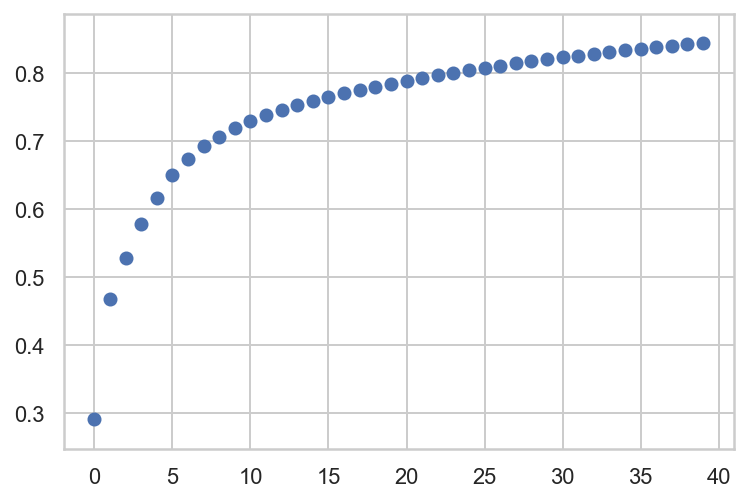

In [9]:
from sklearn.decomposition import PCA 
n_components = 40
pca = PCA(n_components=40).fit(X_train.reshape(-1,784))
plt.scatter(list(range(40)),pca.explained_variance_ratio_.cumsum())
print(pca.components_)

In [10]:
eigen_40 = pca.components_.reshape(n_components, 28, 28)

Text(0.5, 1.05, 'Top 40 Eigen Values')

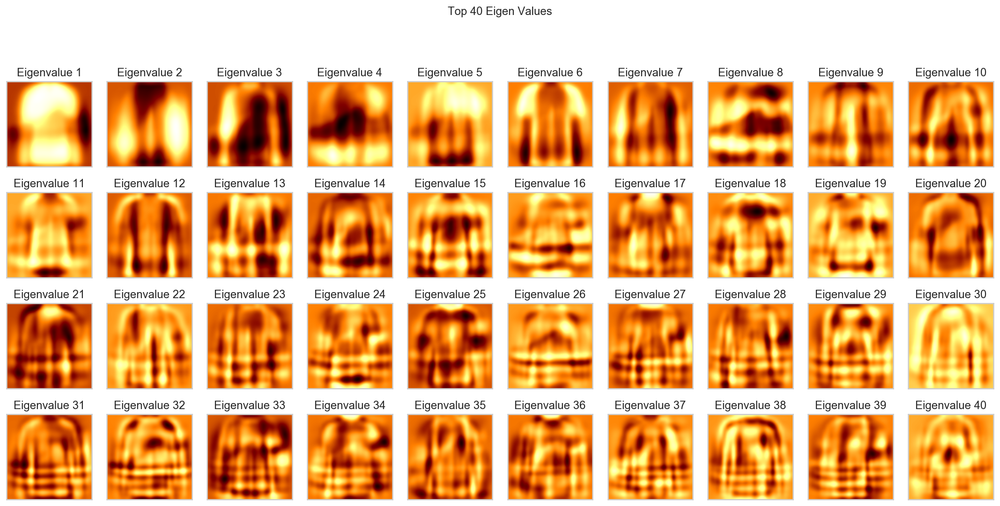

In [11]:
plt.figure(figsize=(15,15))
for i in list(range(40)):
    plt.subplot(9, 10, i + 1)
    plt.imshow(eigen_40[i], interpolation = "bicubic", cmap = "afmhot")
    title_text = 'Eigenvalue ' + str(i + 1)
    plt.title(title_text, size=12)
    plt.xticks(())
    plt.yticks(())
plt.tight_layout()
plt.suptitle('Top 40 Eigen Values',y=1.05)

#### Principal Component Analysis

In [12]:
pca = PCA(n_components=2)
x_2 = pca.fit_transform(X_train.reshape(-1,784))

In [13]:
data = [go.Scatter(
    x = x_2[:,0],
    y = x_2[:,1],
    mode = 'markers',
    showlegend = False,
    marker = dict(
        size = 8,
        color = y_train,
        colorscale ='Rainbow',
        showscale = False,
        line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        ),
        opacity = 0.8
    )
)]

layout = go.Layout(
    title= 'Principal Component Analysis (PCA)',
    hovermode= 'closest',
    xaxis= dict(
        title= 'First Principal Component',
        ticklen= 8,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Second Principal Component',
        ticklen= 8,
        gridwidth= 2,
    ),
    showlegend= True
)

fig = dict(data=data, layout=layout)
pyo.iplot(fig, filename='PCA_plot')

#### KMeans Clustering

In [14]:
%%time
def fit_model(cluster, model=RandomForestClassifier(n_estimators=100, max_depth=10), flag="add"):  
    y_labels_train = cluster.labels_
    y_labels_test = cluster.predict(X_test.reshape(-1,784))
    
    print(f"Adjusted Mutual Info Score Train: {np.round(adjusted_mutual_info_score(y_labels_train,y_train)*100,2)}")
    print(f"Adjusted Mutual Info Score Test: {np.round(adjusted_mutual_info_score(y_labels_test,y_test)*100,2)}")  

    
    if flag == "add":
        train = np.concatenate((X_train.reshape(-1, 784), y_labels_train.reshape(-1,1)),axis=1)
        test = np.concatenate((X_test.reshape(-1, 784), y_labels_test.reshape(-1,1)),axis=1)

    elif flag == "replace":
        train = y_labels_train[:, np.newaxis]
        test = y_labels_test[:, np.newaxis]
  
    else:
        raise ValueError("Flag can either be 'add' or 'replace'.!")

    model.fit(train, y_train)
    y_pred = model.predict(test)
    print(f"Accuracy of the model is: {accuracy_score(y_test,y_pred)*100}%")
    return y_pred

Wall time: 998 µs


In [15]:
%%time
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=10)
kmeans.fit(X_train.reshape(-1,784))

Wall time: 2min 12s


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

#### Replace the data with the clusters

#### Confusion Matrix and Calculating the value of Precision, Recall, Accuracy and F1 score

Adjusted Mutual Info Score Train: 50.07
Adjusted Mutual Info Score Test: 50.06
Accuracy of the model is: 55.98%


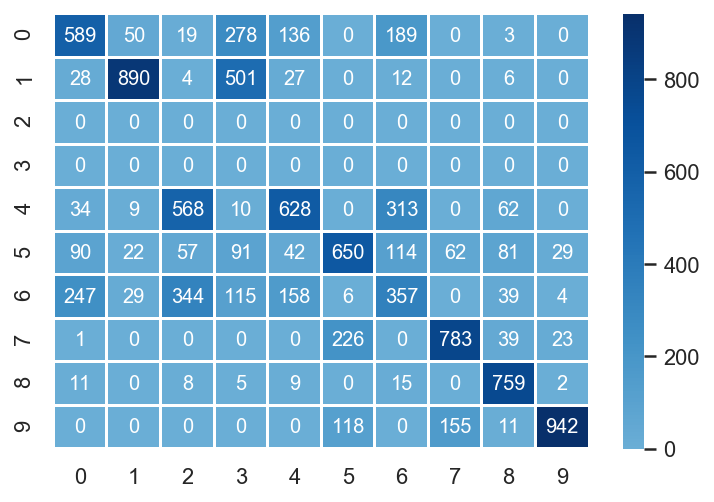

              precision    recall  f1-score   support

           0       0.59      0.47      0.52      1264
           1       0.89      0.61      0.72      1468
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         0
           4       0.63      0.39      0.48      1624
           5       0.65      0.53      0.58      1238
           6       0.36      0.27      0.31      1299
           7       0.78      0.73      0.76      1072
           8       0.76      0.94      0.84       809
           9       0.94      0.77      0.85      1226

    accuracy                           0.56     10000
   macro avg       0.56      0.47      0.51     10000
weighted avg       0.69      0.56      0.61     10000

Wall time: 1.83 s


In [16]:
%%time
y_pred = fit_model(kmeans,flag="replace")

cm = confusion_matrix(y_pred,y_test)
sns.heatmap(cm, annot=True, fmt="d", center=0, linewidth=1,cmap="Blues",xticklabels=np.unique(y_train),yticklabels=np.unique(y_train))
plt.show()

print(classification_report(y_pred,y_test))

#### Add the predicted clusters

#### Confusion Matrix and Calculating the value of Precision, Recall, Accuracy and F1 score

Adjusted Mutual Info Score Train: 50.07
Adjusted Mutual Info Score Test: 50.06
Accuracy of the model is: 84.28999999999999%


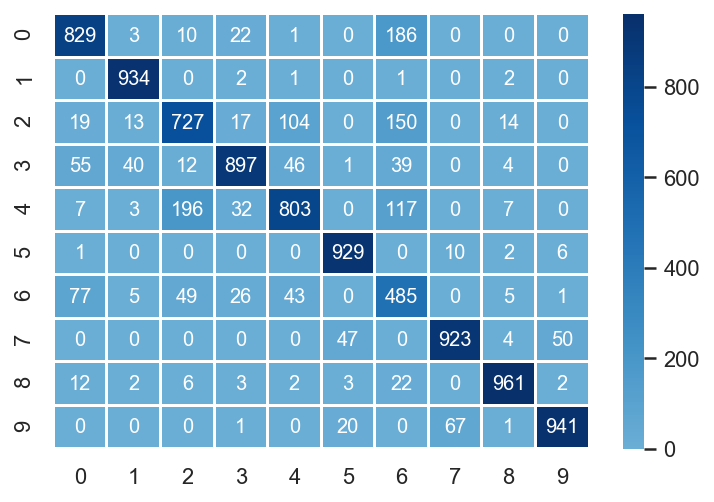

              precision    recall  f1-score   support

           0       0.83      0.79      0.81      1051
           1       0.93      0.99      0.96       940
           2       0.73      0.70      0.71      1044
           3       0.90      0.82      0.86      1094
           4       0.80      0.69      0.74      1165
           5       0.93      0.98      0.95       948
           6       0.48      0.70      0.57       691
           7       0.92      0.90      0.91      1024
           8       0.96      0.95      0.95      1013
           9       0.94      0.91      0.93      1030

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.85      0.84      0.85     10000

Wall time: 39.1 s


In [17]:
%%time
y_pred = fit_model(kmeans,flag="add")

cm = confusion_matrix(y_pred,y_test)
sns.heatmap(cm, annot=True, fmt="d", center=0, linewidth=1,cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.show()

print(classification_report(y_pred,y_test))

In [18]:
kmeans_10 = kmeans.fit_predict(X_train.reshape(-1,784))

data = [
    go.Scatter(
        x= x_2[:, 0], 
        y= x_2[:, 1], 
        mode="markers",
        showlegend=False,
        marker=dict(
            size=8,
            color = kmeans_10,
            colorscale = 'Rainbow',
            showscale=False, 
            line = dict(
                width = 2,
                color = 'rgb(255, 255, 255)'
            )))]

layout = go.Layout(
    title= 'KMeans Clustering',
    hovermode= 'closest',
    xaxis= dict(
         title= 'First Principal Component',
        ticklen= 8,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Second Principal Component',
        ticklen= 8,
        gridwidth= 2,
    ),
    showlegend= True
)

fig = dict(data = data, layout = layout)
pyo.iplot(fig, filename="kmeans_plot")

#### Autoencoder based Kmean Clustering Model

In [19]:
model = Sequential([
                    Conv2D(32,kernel_size=3, padding="SAME",activation="relu",input_shape=(28,28,1)),
                    BatchNormalization(),
                    MaxPool2D(pool_size=(2,2),padding="SAME"),
                    Dropout(rate=0.2),
                    Conv2D(16, kernel_size=3, padding="SAME",activation="relu"),
                    BatchNormalization(),
                    MaxPool2D(pool_size=(2,2),padding="SAME"),
                    Dropout(rate=0.2),
                    Conv2D(16, kernel_size=3, padding="SAME",activation="relu"),
                    BatchNormalization(),
                    UpSampling2D((2,2)),
                    Dropout(rate=0.2),
                    Conv2D(32, kernel_size=3, padding="SAME",activation="relu"),
                    BatchNormalization(),
                    UpSampling2D((2,2)),
                    Dropout(rate=0.2),
                    Conv2D(1, kernel_size=3, padding="SAME",activation="relu")
])

model.compile(optimizer="adam",loss="mse")

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization (BatchNo (None, 28, 28, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 16)        4624      
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 16)        64        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 16)          0

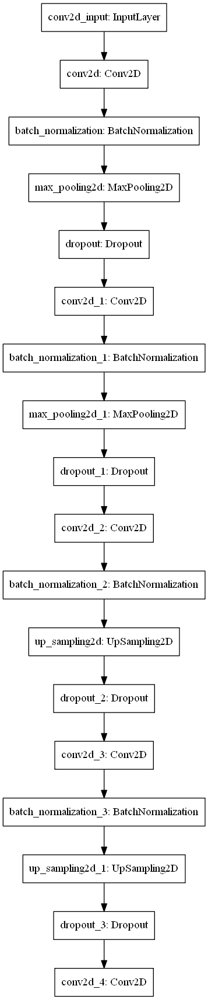

In [21]:
plot_model(model)

#### Training the Auto encoder

In [22]:
def decay(epochs):
    if epochs < 5:
        return 1e-3
    elif epochs >= 5 and epochs < 15:
        return 1e-4
    else :
        return 1e-5

autoencoder_history = model.fit(X_train, 
                                X_train, 
                                epochs=10, 
                                batch_size=256, 
                                validation_data=(X_validate, 
                                                 X_validate), 
                                verbose=1, 
                                callbacks = [
                                             ModelCheckpoint(filepath="autoencoder_checkpoint",
                                                             monitor="val_loss",
                                                             verbose=1, 
                                                             save_best_only=True,
                                                             save_weights_only=True,
                                                             mode="auto"),
                                             EarlyStopping(monitor='val_loss',
                                                           patience=5,
                                                           verbose=1),
                                             LearningRateScheduler(schedule=decay,
                                                                   verbose=1),
                                             TensorBoard(log_dir="logs")
                                ])

Train on 48000 samples, validate on 12000 samples

Epoch 00001: LearningRateScheduler reducing learning rate to 0.001.
Epoch 1/10
47872/48000 [============================>.] - ETA: 0s - loss: 0.1656
Epoch 00001: val_loss improved from inf to 0.06595, saving model to autoencoder_checkpoint
48000/48000 [==============================] - 168s 3ms/sample - loss: 0.1653 - val_loss: 0.0660

Epoch 00002: LearningRateScheduler reducing learning rate to 0.001.
Epoch 2/10
47872/48000 [============================>.] - ETA: 0s - loss: 0.0375
Epoch 00002: val_loss improved from 0.06595 to 0.04041, saving model to autoencoder_checkpoint
48000/48000 [==============================] - 173s 4ms/sample - loss: 0.0375 - val_loss: 0.0404

Epoch 00003: LearningRateScheduler reducing learning rate to 0.001.
Epoch 3/10
47872/48000 [============================>.] - ETA: 0s - loss: 0.0261
Epoch 00003: val_loss improved from 0.04041 to 0.02386, saving model to autoencoder_checkpoint
48000/48000 [============

#### Plotting the Autoencoder Training and Validation Loss

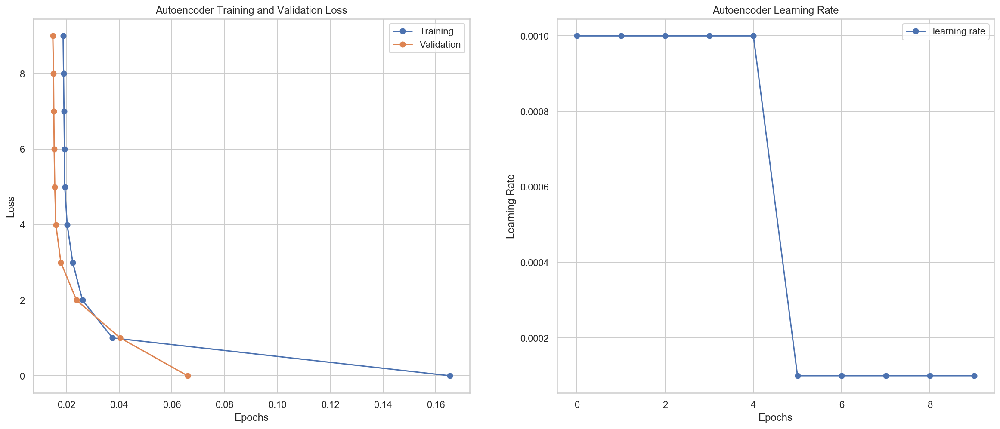

In [23]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(autoencoder_history.history["loss"],autoencoder_history.epoch,label="Training",marker='o')
plt.plot(autoencoder_history.history["val_loss"],autoencoder_history.epoch,label="Validation",marker='o')
plt.title("Autoencoder Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1,2,2)
plt.plot(autoencoder_history.epoch,autoencoder_history.history["lr"],label="learning rate",marker='o')
plt.title("Autoencoder Learning Rate")
plt.xlabel("Epochs")
plt.ylabel("Learning Rate")
plt.legend()

In [24]:
restored_testing_dataset = model.predict(X_test)

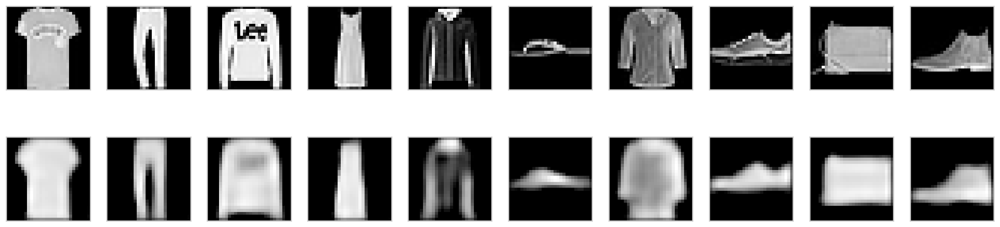

In [25]:
plt.figure(figsize=(20,5))
for i in range(10):
    index = y_test.tolist().index(i)
    plt.subplot(2, 10, i+1)
    plt.imshow(X_test[index].reshape((28,28)))
    plt.xticks([])
    plt.yticks([])
    plt.gray()
    plt.subplot(2, 10, i+11)
    plt.imshow(restored_testing_dataset[index].reshape((28,28)))
    plt.gray()
    plt.xticks([])
    plt.yticks([])

In [26]:
for i, name in enumerate(model.layers):
  print(i, name.name)

0 conv2d
1 batch_normalization
2 max_pooling2d
3 dropout
4 conv2d_1
5 batch_normalization_1
6 max_pooling2d_1
7 dropout_1
8 conv2d_2
9 batch_normalization_2
10 up_sampling2d
11 dropout_2
12 conv2d_3
13 batch_normalization_3
14 up_sampling2d_1
15 dropout_3
16 conv2d_4


In [27]:
encoder = K.function([model.layers[0].input], [model.layers[8].output])

In [28]:
encoded_train_images = encoder([X_train])[0].reshape(-1,7*7*16)
encoded_test_images = encoder([X_test])[0].reshape(-1,7*7*16)

In [29]:
%%time
def kmean_fit_model(cluster, model=RandomForestClassifier(n_estimators=100, max_depth=10), flag="add"):  
    y_labels_train = cluster.labels_
    y_labels_test = cluster.predict(encoded_test_images)
    print(f"Adjusted Mutual Info Score Train: {np.round(adjusted_mutual_info_score(y_labels_train,y_train),2)*100}")
    print(f"Adjusted Mutual Info Score Test: {np.round(adjusted_mutual_info_score(y_labels_test,y_test),2)*100}")  
    if flag == "add":
        train = np.concatenate((encoded_train_images, y_labels_train.reshape(-1,1)),axis=1)
        test = np.concatenate((encoded_test_images, y_labels_test.reshape(-1,1)),axis=1)

    elif flag == "replace":
        train = y_labels_train[:, np.newaxis]
        test = y_labels_test[:, np.newaxis]
  
    else:
        raise ValueError("Flag can either be 'add' or 'replace'.!")

    model.fit(train, y_train)
    y_pred = model.predict(test)
    print(f"Accuracy of the model is: {np.round(accuracy_score(y_test,y_pred)*100,2)}%")
    return y_pred

Wall time: 0 ns


#### Autoencoder based Kmean Clustering

In [30]:
%%time
kmeans = KMeans(n_clusters=10)
clustered_training_set = kmeans.fit(encoded_train_images)

Wall time: 1min 56s


#### Replace the data with the clusters

#### Confusion Matrix and Calculating the value of Precision, Recall, Accuracy and F1 score

Adjusted Mutual Info Score Train: 49.0
Adjusted Mutual Info Score Test: 49.0
Accuracy of the model is: 51.85%


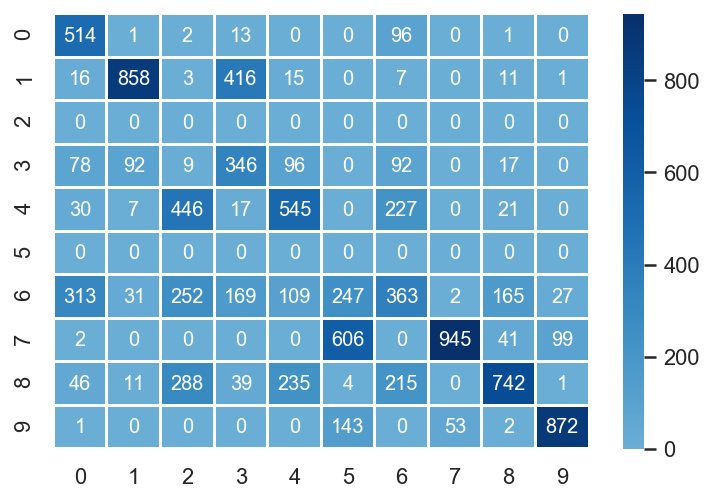

              precision    recall  f1-score   support

           0       0.51      0.82      0.63       627
           1       0.86      0.65      0.74      1327
           2       0.00      0.00      0.00         0
           3       0.35      0.47      0.40       730
           4       0.55      0.42      0.48      1293
           5       0.00      0.00      0.00         0
           6       0.36      0.22      0.27      1678
           7       0.94      0.56      0.70      1693
           8       0.74      0.47      0.57      1581
           9       0.87      0.81      0.84      1071

    accuracy                           0.52     10000
   macro avg       0.52      0.44      0.46     10000
weighted avg       0.67      0.52      0.57     10000

Wall time: 2.23 s


In [31]:
%%time
y_pred = kmean_fit_model(kmeans,flag="replace")

cm = confusion_matrix(y_pred,y_test)
sns.heatmap(cm, annot=True, fmt="d", center=0, linewidth=1,cmap="Blues",xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.show()

print(classification_report(y_pred,y_test))

#### Add the predicted clusters

#### Confusion Matrix and Calculating the value of Precision, Recall, Accuracy and F1 score

Adjusted Mutual Info Score Train: 49.0
Adjusted Mutual Info Score Test: 49.0
Accuracy of the model is: 83.42%


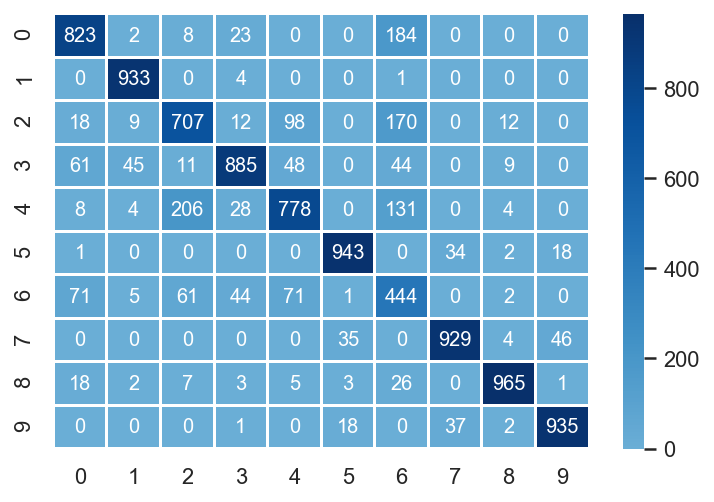

              precision    recall  f1-score   support

           0       0.82      0.79      0.81      1040
           1       0.93      0.99      0.96       938
           2       0.71      0.69      0.70      1026
           3       0.89      0.80      0.84      1103
           4       0.78      0.67      0.72      1159
           5       0.94      0.94      0.94       998
           6       0.44      0.64      0.52       699
           7       0.93      0.92      0.92      1014
           8       0.96      0.94      0.95      1030
           9       0.94      0.94      0.94       993

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.85      0.83      0.84     10000

Wall time: 59.4 s


In [32]:
%%time
y_pred = kmean_fit_model(kmeans,flag="add")

cm = confusion_matrix(y_pred,y_test)
sns.heatmap(cm, annot=True, fmt="d", center=0, linewidth=1,cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.show()

print(classification_report(y_pred,y_test))

#### Autoencoder based GMM Clustering

In [33]:
%%time
import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, adjusted_mutual_info_score

def gmm_fit_model(cluster, model=RandomForestClassifier(n_estimators=100, max_depth=10), flag="add"):  
    y_labels_train = cluster.predict(encoded_train_images)
    y_labels_test = cluster.predict(encoded_test_images)

    print(f"Adjusted Mutual Info Score Train: {np.round(adjusted_mutual_info_score(y_labels_train,y_train)*100,2)}")
    print(f"Adjusted Mutual Info Score Test: {np.round(adjusted_mutual_info_score(y_labels_test,y_test)*100,2)}")  

    if flag == "add":
        train = np.concatenate((encoded_train_images, y_labels_train.reshape(-1,1)),axis=1)
        test = np.concatenate((encoded_test_images, y_labels_test.reshape(-1,1)),axis=1)

    elif flag == "replace":
        train = y_labels_train[:, np.newaxis]
        test = y_labels_test[:, np.newaxis]
  
    else:
        raise ValueError("Flag can either be 'add' or 'replace'.!")

    model.fit(train, y_train)
    y_pred = model.predict(test)
    print(f"Accuracy of the model is: {np.round(accuracy_score(y_test,y_pred)*100,2)}%")
    return y_pred

Wall time: 0 ns


In [34]:
%%time
gmm = GaussianMixture(n_components=10, covariance_type="full")
clustered_training_set = gmm.fit(encoded_train_images)

Wall time: 21min 15s


#### Replace the data with the clusters

#### Confusion Matrix and Calculating the value of Precision, Recall, Accuracy and F1 score

Adjusted Mutual Info Score Train: 55.78
Adjusted Mutual Info Score Test: 56.34
Accuracy of the model is: 59.25%


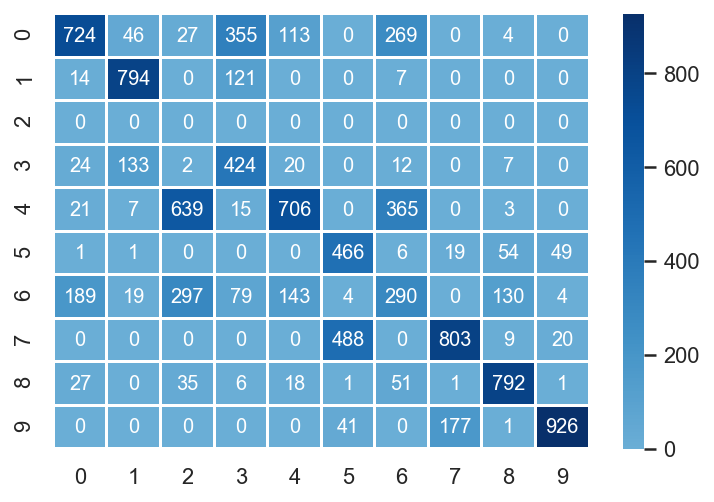

              precision    recall  f1-score   support

           0       0.72      0.47      0.57      1538
           1       0.79      0.85      0.82       936
           2       0.00      0.00      0.00         0
           3       0.42      0.68      0.52       622
           4       0.71      0.40      0.51      1756
           5       0.47      0.78      0.58       596
           6       0.29      0.25      0.27      1155
           7       0.80      0.61      0.69      1320
           8       0.79      0.85      0.82       932
           9       0.93      0.81      0.86      1145

    accuracy                           0.59     10000
   macro avg       0.59      0.57      0.57     10000
weighted avg       0.68      0.59      0.62     10000

Wall time: 24.3 s


In [35]:
%%time
y_pred = gmm_fit_model(gmm,flag="replace")

cm = confusion_matrix(y_pred,y_test)
sns.heatmap(cm, annot=True, fmt="d", center=0, linewidth=1,cmap="Blues",xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.show()

print(classification_report(y_pred,y_test))

#### Add the predicted clusters

#### Confusion Matrix and Calculating the value of Precision, Recall, Accuracy and F1 score

Adjusted Mutual Info Score Train: 55.78
Adjusted Mutual Info Score Test: 56.34
Accuracy of the model is: 83.2%


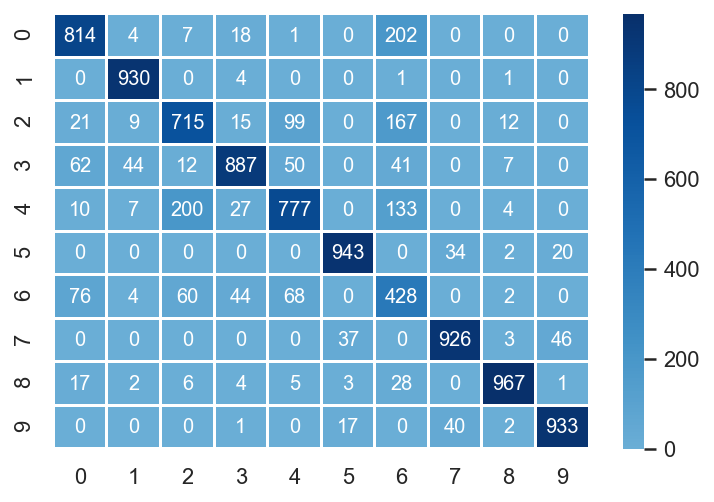

              precision    recall  f1-score   support

           0       0.81      0.78      0.80      1046
           1       0.93      0.99      0.96       936
           2       0.71      0.69      0.70      1038
           3       0.89      0.80      0.84      1103
           4       0.78      0.67      0.72      1158
           5       0.94      0.94      0.94       999
           6       0.43      0.63      0.51       682
           7       0.93      0.92      0.92      1012
           8       0.97      0.94      0.95      1033
           9       0.93      0.94      0.94       993

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.84      0.83      0.84     10000

Wall time: 1min 30s


In [36]:
%%time
y_pred = gmm_fit_model(gmm,flag="add")

cm = confusion_matrix(y_pred,y_test)
sns.heatmap(cm, annot=True, fmt="d", center=0, linewidth=1,cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.show()

print(classification_report(y_pred,y_test))